# Murine thymus analysis

In [7]:
import scanpy as sc
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import scvelo as scv
import scanpy.external as sce
import os

PROJECT_DIR = "/home/sisaev/projects/Gustafsson_et_al_2022"
DATA_DIR = "/home/sisaev/data/thymus_Karin/count"
exec(open(f"{PROJECT_DIR}/tools/tools.py").read())

sc.settings.verbosity = 3
sns.set(font_scale=1)
sc.settings.set_figure_params(dpi=150)
sns.set_style("white")
Reds = get_beautiful_cmap()

sample_type = {
    "SCG_MTH2_IR" : "IR",
    "ID_MTH5_IR" : "IR",
    "SCG_MTH7_IR" : "IR",
    "SCG_65" : "control",
    "SCG_MTH2_C" : "control",
    "SCG_MTH3_C" : "control",
    "SCG_MTH4_C" : "control",
    "ID_MTH9_Old_M1" : "aged",
    "ID_MTH9_Old_M2" : "aged", 
    "ID_MTH9_Old_F3" : "aged", 
    "ID_MTH9_Old_F4" : "aged",
    "SCG_MTH3_IL7_C" : "Il7ko",
    "ID_MTH5_IL7_C" : "Il7ko",
    "SCG_MTH8_IL7_C1" : "Il7ko",
    "SCG_MTH8_IL7_C2" : "Il7ko"
}

In [162]:
%load_ext rpy2.ipython

The rpy2.ipython extension is already loaded. To reload it, use:
  %reload_ext rpy2.ipython


In [816]:
%%R
library(ggplot2)
library(DescTools)
library(cowplot)
library(patchwork)
library(conos)
library(cacoa)

## Common embedding

In [581]:
adata = sc.read_h5ad(f"{PROJECT_DIR}/data/Mouse_AllCells.h5ad")
os.mkdir(f"{PROJECT_DIR}/data/Mouse_AllCells_pagoda2_conos/")
adata = run_conos_pagoda2(
    adata,
    batch_key="sample_id",
    script_path=f"{PROJECT_DIR}/tools/conos_wrapper.R",
    tmp_dir=f"{PROJECT_DIR}/data/Mouse_AllCells_pagoda2_conos/"
)

(1/3) Writing .h5ad-file
(2/3) Running wrapper (it may takes a long time)
(3/3) Reading conos outputs


running Leiden clustering
    finished: found 29 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:20)


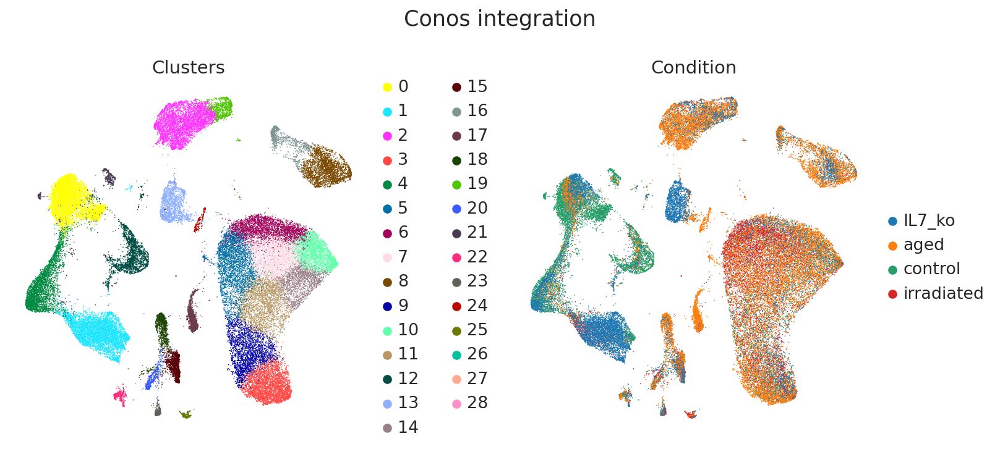

In [643]:
sc.tl.leiden(adata, resolution=3)

fig, axes = plt.subplots(ncols=2, dpi=150, figsize=(11, 5))
sc.pl.umap(adata, color=["leiden"], frameon=False, title="Clusters", ax=axes[0], show=False)
sc.pl.umap(adata, color=["condition"], frameon=False, title="Condition", ax=axes[1], show=False)
fig.suptitle("Conos integration")
fig.tight_layout()

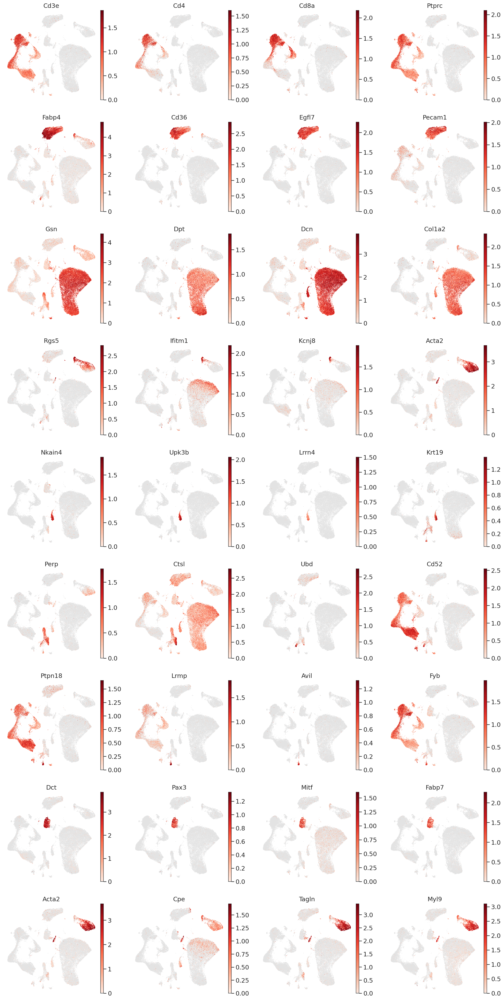

In [653]:
sc.pl.umap(
    adata,
    cmap=Reds,
    ncols=4,
    frameon=False,
    color=[
        "Cd3e", "Cd4", "Cd8a", "Ptprc", # HC
        "Fabp4", "Cd36", "Egfl7", "Pecam1", # EC
        "Gsn", "Dpt", "Dcn", "Col1a2", # MC
        "Rgs5", "Ifitm1", "Kcnj8", "Acta2", # PV, aPVx2, pcPV
        "Nkain4", "Upk3b", "Lrrn4", "Krt19", # Lrrn4+
        "Perp", "Ctsl", "Ubd", "Cd52", # TEC Ax2, TEC Bx2
        "Ptpn18", "Lrmp", "Avil", "Fyb", # Tuft cells
        "Dct", "Pax3", "Mitf", "Fabp7", # NC
        "Acta2", "Cpe", "Tagln", "Myl9" # Smooth muscle cells
    ]
)

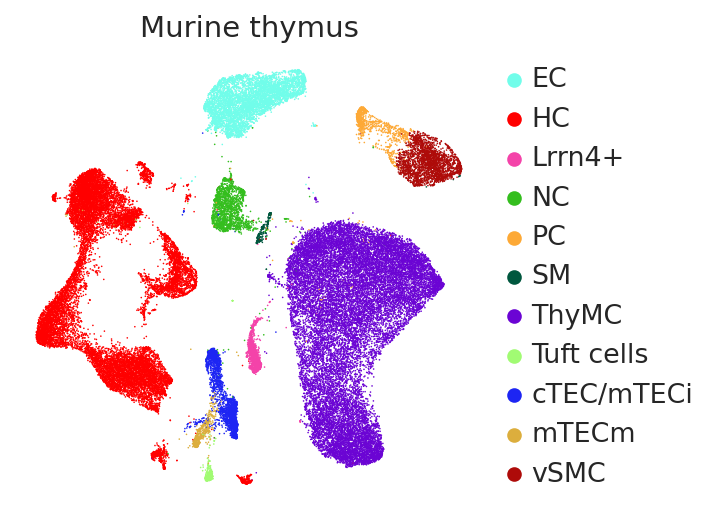

In [8]:
ct_to_leiden = {
    "HC" : ["0", "1", "4", "12", "21", "22", "25"],
    "ThyMC" : ["3", "5", "6", "7", "9", "10", "11", "14"],
    "EC" : ["2", "19"],
    "vSMC" : ["8"],
    "PC" : ["16"],
    "NC" : ["13"],
    "cTEC/mTECi" : ["15", "18"],
    "mTECm" : ["20"],
    "Lrrn4+" : ["17"],
    "SM" : ["24"],
    "Tuft cells" : ["23"],
    "Unknown" : ["26", "27", "28"]
}

paper_cmap = {
    "EC" : "#71fdea",
    "cTEC/mTECi" : "#1d25f3",
    "mTECm" : "#dcae3d",
    "vSMC" : "#ae0b09",
    "PC" : "#fda936",
    "Tuft cells" : "#a1fb73",
    "Lrrn4+" : "#f443a9",
    "ThyMC" : "#6b04d4",
    "NC" : "#34be1e",
    "HC" : "#ff0000",
    "SM" : "#00573e",
    "Penk+ ThyMC" : "#00b3f4",
    "Cd248+ ThyMC" : "#008af6",
    "Postn+ ThyMC" : "#ed00ff"
}

leiden_to_ct = {}
for ct in ct_to_leiden:
    for leiden in ct_to_leiden[ct]:
        leiden_to_ct[leiden] = ct
adata.obs["cell_type"] = [leiden_to_ct[leiden] for leiden in adata.obs.leiden]
adata = adata[adata.obs.cell_type != "Unknown"]
adata.obs["cell_type"] = adata.obs["cell_type"].astype("category")
adata.uns["cell_type_colors"] = [paper_cmap[cell_type] for cell_type in adata.obs["cell_type"].cat.categories]

sc.pl.umap(adata, color="cell_type", frameon=False, title="Murine thymus")

## Mesenchymal cells

In [683]:
adata_MC = adata[adata.obs.cell_type == "ThyMC"].copy()
adata_MC.X = adata_MC.layers["counts"].copy()
os.mkdir(f"{PROJECT_DIR}/data/Mouse_MC_pagoda2_conos/")
adata = run_conos_pagoda2(
    adata,
    batch_key="sample_id",
    n_hvg=1000,
    n_comps=15,
    script_path=f"{PROJECT_DIR}/tools/conos_wrapper.R",
    tmp_dir=f"{PROJECT_DIR}/data/Mouse_MC_pagoda2_conos/"
)

(1/3) Writing .h5ad-file
(2/3) Running wrapper (it may takes a long time)
(3/3) Reading conos outputs


running Leiden clustering
    finished: found 3 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:03)


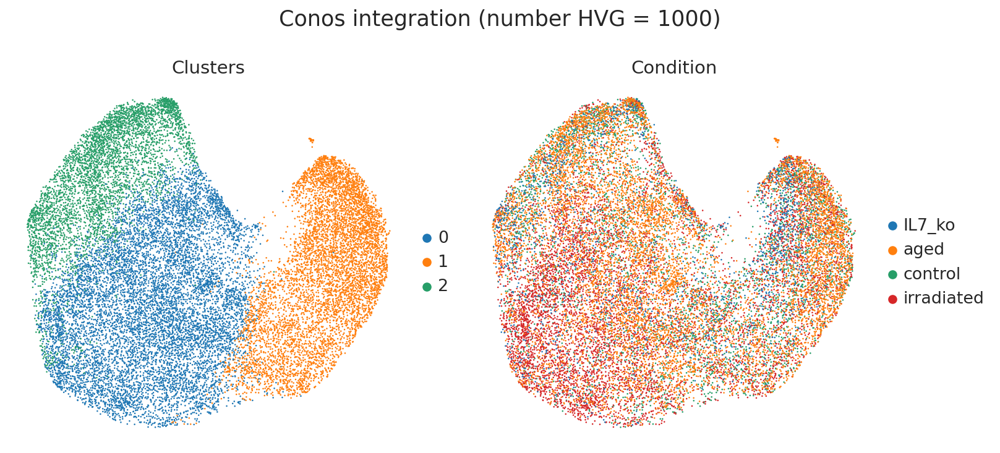

In [687]:
sc.tl.leiden(adata_MC, resolution=0.4)

fig, axes = plt.subplots(ncols=2, dpi=150, figsize=(11, 5))
sc.pl.umap(adata_MC, color=["leiden"], frameon=False, title="Clusters", ax=axes[0], show=False)
sc.pl.umap(adata_MC, color=["condition"], frameon=False, title="Condition", ax=axes[1], show=False)
fig.suptitle("Conos integration (number HVG = 1000)")
fig.tight_layout()

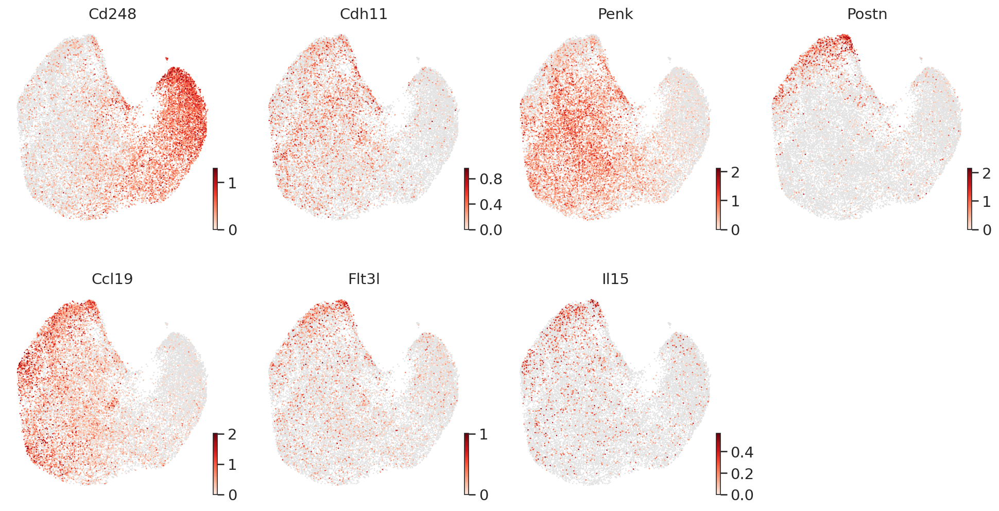

In [833]:
scv.pl.umap(
    adata_MC,
    color=[
        "Cd248", "Cdh11", "Penk", "Postn",
        "Ccl19", "Flt3l", "Il15"
    ],
    cmap=Reds,
    ncols=4
)

<AxesSubplot:title={'center':'Only control samples'}, xlabel='UMAP1', ylabel='UMAP2'>

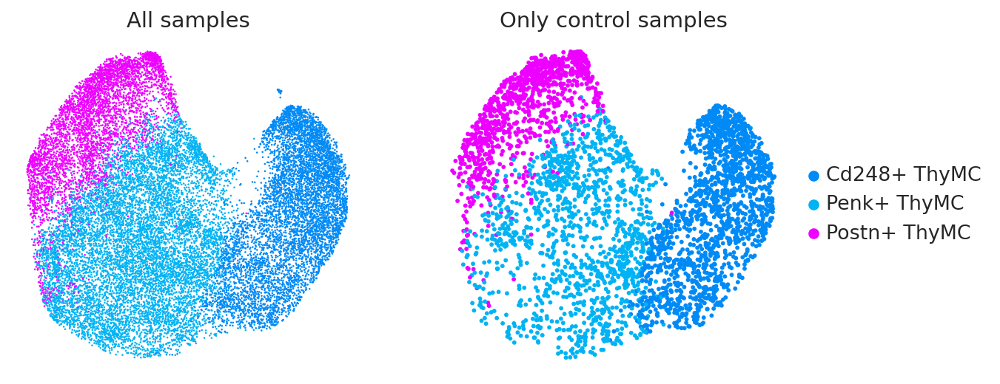

In [9]:
MC_annotation = {
    "0" : "Penk+ ThyMC",
    "1" : "Cd248+ ThyMC",
    "2" : "Postn+ ThyMC"
}

adata_MC.obs["cell_type_l2"] = [MC_annotation[leiden] for leiden in adata_MC.obs.leiden]
adata_MC.obs["cell_type_l2"] = adata_MC.obs["cell_type_l2"].astype("category")
adata_MC.uns["cell_type_l2_colors"] = [paper_cmap[cell_type] for cell_type in adata_MC.obs["cell_type_l2"].cat.categories]

fig, axes = plt.subplots(ncols=2, dpi=150, figsize=(9, 4))
sc.pl.umap(adata_MC, color=["cell_type_l2"], title=["All samples"], frameon=False, ax=axes[0], show=False, legend_loc=None)
sc.pl.umap(adata_MC[adata_MC.obs.condition == "control"], color=["cell_type_l2"], title=["Only control samples"], frameon=False, ax=axes[1], show=False)

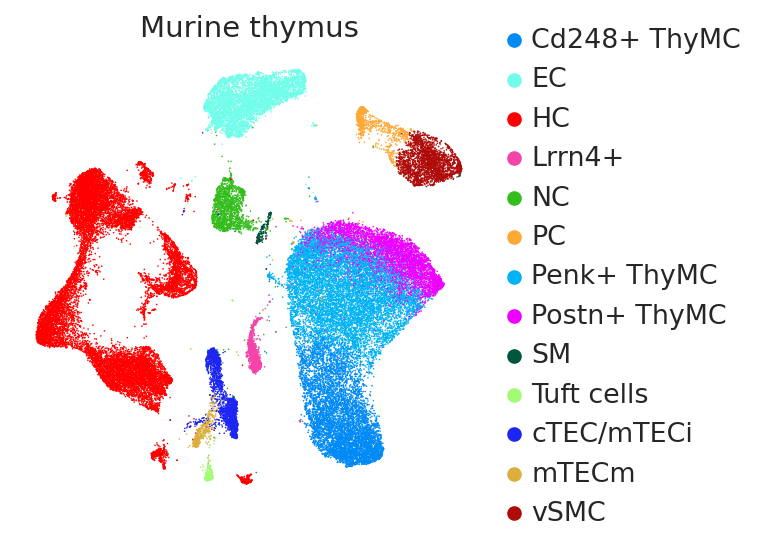

In [10]:
adata.obs["cell_type_l2"] = adata.obs["cell_type"].copy()
cell_type_l2 = []
for MC_barcode in adata.obs.index:
    if MC_barcode in adata_MC.obs.index:
        cell_type_l2.append(adata_MC.obs.loc[MC_barcode]["cell_type_l2"])
    else:
        cell_type_l2.append(adata.obs.loc[MC_barcode]["cell_type"])
adata.obs["cell_type_l2"] = cell_type_l2
adata.obs["cell_type_l2"] = adata.obs["cell_type_l2"].astype("category")
adata.uns["cell_type_l2_colors"] = [paper_cmap[cell_type] for cell_type in adata.obs["cell_type_l2"].cat.categories]
del cell_type_l2

sc.pl.umap(adata, color="cell_type_l2", frameon=False, title="Murine thymus")

## Stromal cells

In [709]:
adata_SC = adata.copy(); adata_SC = adata_SC[adata_SC.obs.cell_type != "HC"]
adata_SC.X = adata_SC.layers["counts"].copy()

os.mkdir(f"{PROJECT_DIR}/data/Mouse_SC_pagoda2_conos/")
adata = run_conos_pagoda2(
    adata_SC,
    batch_key="sample_id",
    script_path=f"{PROJECT_DIR}/tools/conos_wrapper.R",
    tmp_dir=f"{PROJECT_DIR}/data/Mouse_SC_pagoda2_conos/"
)

(1/3) Writing .h5ad-file
(2/3) Running wrapper (it may takes a long time)
(3/3) Reading conos outputs


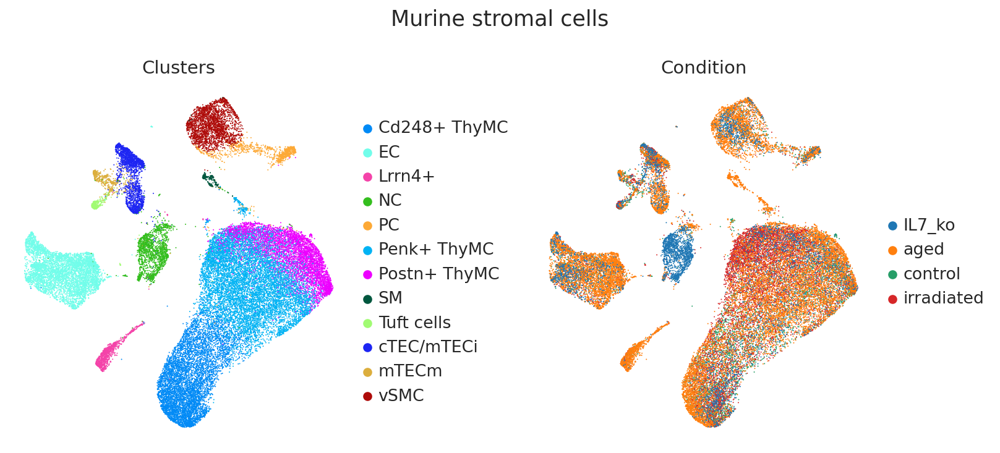

In [11]:
adata_SC.uns["cell_type_colors"] = [paper_cmap[cell_type] for cell_type in adata_SC.obs["cell_type"].cat.categories]
adata_SC.uns["cell_type_l2_colors"] = [paper_cmap[cell_type] for cell_type in adata_SC.obs["cell_type_l2"].cat.categories]

fig, axes = plt.subplots(ncols=2, dpi=150, figsize=(11, 5))
sc.pl.umap(adata_SC, color=["cell_type_l2"], frameon=False, title="Clusters", ax=axes[0], show=False)
sc.pl.umap(adata_SC, color=["condition"], frameon=False, title="Condition", ax=axes[1], show=False)
fig.suptitle("Murine stromal cells")
fig.tight_layout()

In [12]:
adata_SC.layers["z-score"] = adata_SC.X.copy()
sc.pp.scale(adata_SC, layer="z-score")

adata_SC.obs.cell_type = adata_SC.obs.cell_type.cat.reorder_categories([
    "EC", "ThyMC", "PC", "vSMC", "SM", "cTEC/mTECi", "mTECm", "Tuft cells", "Lrrn4+", "NC"
])

... as `zero_center=True`, sparse input is densified and may lead to large memory consumption


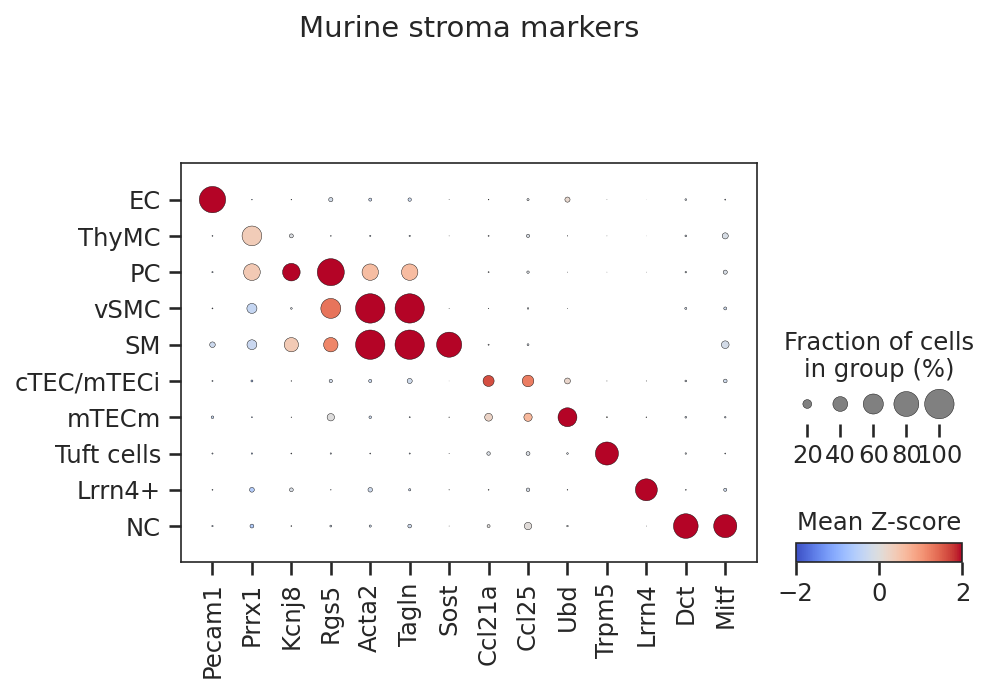

In [13]:
markers = {
    "EC" : ["Pecam1"],
    "ThyMC" : ["Prrx1"],
    "PC" : ["Kcnj8", "Rgs5"],
    "vSMC" : ["Acta2"],
    "MS" : ["Tagln", "Sost"],
    "cTEC/mTECi" : ["Ccl21a", "Ccl25"],
    "mTECm" : ["Ubd"],
    "Tuft cells" : ["Trpm5"],
    "Lrrn4+" : ["Lrrn4"],
    "NC" : ["Dct", "Mitf"],
}

sns.set_style("ticks")
sc.pl.dotplot(
    adata_SC,
    var_names=sum(markers.values(), []),
    groupby="cell_type",
    cmap="coolwarm",
    layer="z-score",
    vmin=-2,
    vmax=2,
    colorbar_title="Mean Z-score",
    title="Murine stroma markers"
)

## Pathways

In [14]:
import progeny

model = progeny.load_model(organism="Mouse", top=1000)
progeny.run(
    adata_MC,
    model,
    center=True,
    num_perm=100,
    norm=True,
    scale=True,
    use_raw=False,
    min_size=5
)

9193 genes found


100%|██████████| 100/100 [00:16<00:00,  6.12it/s]


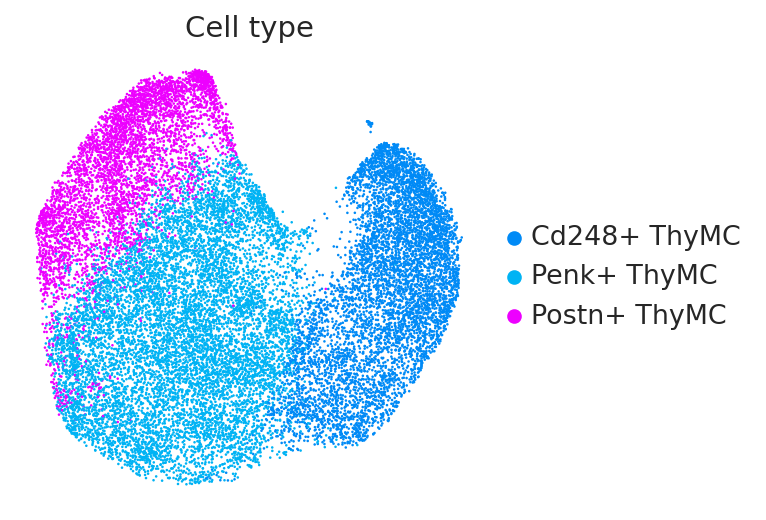

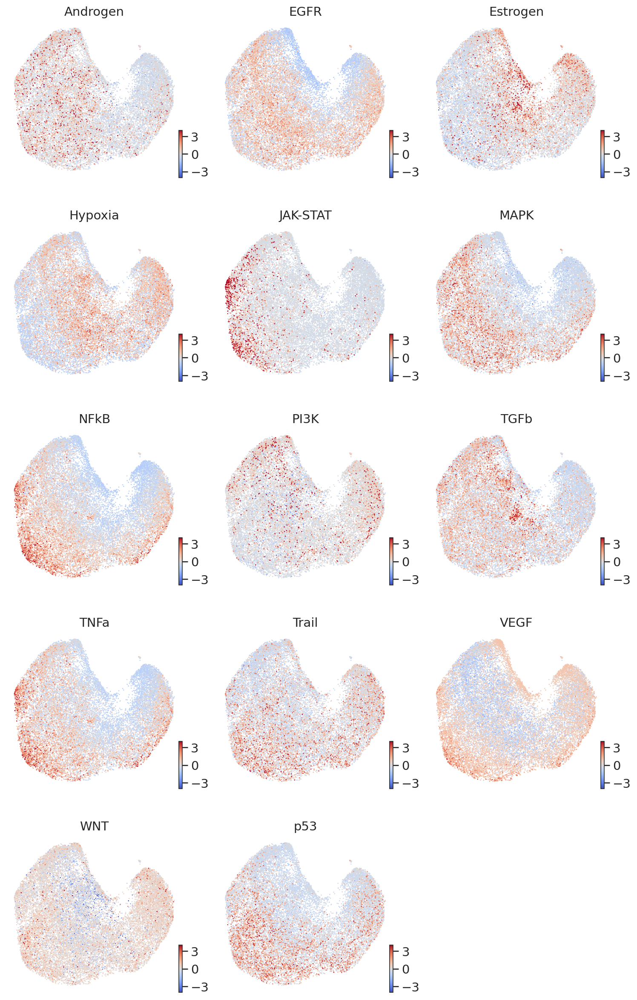

In [15]:
adata_MC_progeny = progeny.extract(adata_MC)
sc.pl.umap(adata_MC, color="cell_type_l2", title="Cell type", frameon=False)
scv.pl.umap(adata_MC_progeny, color=adata_MC_progeny.var.index, vmin=-4, vmax=4, cmap="coolwarm", ncols=3)

In [756]:
adata.write_h5ad(f"{PROJECT_DIR}/data/Mouse_AllCells_conos.h5ad")
adata_MC.write_h5ad(f"{PROJECT_DIR}/data/Mouse_MC_conos.h5ad")
adata_SC.write_h5ad(f"{PROJECT_DIR}/data/Mouse_SC_conos.h5ad")

## SC DEG analysis

In [16]:
adata_SC = sc.read_h5ad(f"{PROJECT_DIR}/data/Mouse_SC_conos.h5ad")
adata_SC.obs["sample_cell_type_l2"] = adata_SC.obs.sample_id.astype(str) + " | " + adata_SC.obs.cell_type_l2.astype(str)
adata_SC.obs["sample_cell_type"] = adata_SC.obs.sample_id.astype(str) + " | " + adata_SC.obs.cell_type.astype(str)

In [17]:
MC_DE = get_DESeq_multigroup(adata_SC[adata_SC.obs.condition == "control"],
                             split_by="sample_cell_type",
                             grouping="cell_type")

R[write to console]:   Note: levels of factors in the design contain characters other than
  letters, numbers, '_' and '.'. It is recommended (but not required) to use
  only letters, numbers, and delimiters '_' or '.', as these are safe characters
  for column names in R. [This is a message, not a warning or an error]

R[write to console]: estimating size factors

R[write to console]:   Note: levels of factors in the design contain characters other than
  letters, numbers, '_' and '.'. It is recommended (but not required) to use
  only letters, numbers, and delimiters '_' or '.', as these are safe characters
  for column names in R. [This is a message, not a warning or an error]

R[write to console]: estimating dispersions

R[write to console]: gene-wise dispersion estimates

R[write to console]: mean-dispersion relationship

R[write to console]: -- note: fitType='parametric', but the dispersion trend was not well captured by the
   function: y = a/x + b, and a local regression fit wa

In [20]:
target_df = {}
target_genes = ["Ccl19", "Flt3l", "Il15"]
for gene in target_genes:
    target_df[gene] = []
    for celltype in MC_DE["DE"]["ThyMC"].keys():
        target_df[gene].append(MC_DE["DE"]["ThyMC"][celltype][MC_DE["DE"]["ThyMC"][celltype].id == gene].pvalue[0])
target_df = pd.DataFrame(target_df, index=MC_DE["DE"]["ThyMC"].keys())
target_df.index = "ThyMC vs. " + target_df.index
target_df

,Ccl19,Flt3l,Il15
ThyMC vs. PC,0.149325,0.163278,0.286604
ThyMC vs. EC,0.000002,0.012130,0.402705
ThyMC vs. NC,0.008226,0.565436,0.810262
ThyMC vs. Lrrn4+,0.000776,0.184528,0.144424
ThyMC vs. vSMC,0.000013,0.001245,0.116849
ThyMC vs. cTEC/mTECi,0.626488,0.000598,0.387612
ThyMC vs. Tuft cells,0.000002,0.013360,0.021822
ThyMC vs. mTECm,0.301910,0.127874,0.530982


In [21]:
correct_all_pvalues(target_df, correction_method="fdr_bh")

,Ccl19,Flt3l,Il15
ThyMC vs. PC,0.255985,0.261245,0.402547
ThyMC vs. EC,0.000029,0.035626,0.483246
ThyMC vs. NC,0.028205,0.616839,0.810262
ThyMC vs. Lrrn4+,0.003723,0.276793,0.255985
ThyMC vs. vSMC,0.000105,0.004981,0.254943
ThyMC vs. cTEC/mTECi,0.653727,0.003588,0.483246
ThyMC vs. Tuft cells,0.000029,0.035626,0.052373
ThyMC vs. mTECm,0.402547,0.255748,0.606837


In [22]:
df_counts = MC_DE["normalized counts"].loc[target_genes].T
df_counts["sample_id"] = [index.split(" | ")[0] for index in df_counts.index]
df_counts["cell_type"] = [index.split(" | ")[1] for index in df_counts.index]
df_counts.index = range(len(df_counts))
df_counts.sort_values(by="cell_type")

id,Ccl19,Flt3l,Il15,sample_id,cell_type
35,0.000000,2.221753,2.221753,SCG_MTH2_C,EC
23,0.371476,1.114428,2.971807,SCG_MTH4_C,EC
7,0.000000,1.685086,2.948901,SCG_MTH3_C,EC
15,0.000000,1.090983,3.272948,SCG_65,EC
33,0.783892,1.567783,0.391946,SCG_MTH4_C,Lrrn4+
3,0.000000,0.000000,0.000000,SCG_MTH2_C,Lrrn4+
22,0.000000,3.936146,1.312049,SCG_MTH3_C,Lrrn4+
12,2.990465,2.990465,0.000000,SCG_65,Lrrn4+
21,43.161207,0.000000,0.000000,SCG_MTH4_C,NC
34,0.000000,0.000000,0.000000,SCG_65,NC


## MC DEG analysis

In [23]:
adata_MC = sc.read_h5ad(f"{PROJECT_DIR}/data/Mouse_MC_conos.h5ad")
adata_MC.obs["sample_cell_type_l2"] = adata_MC.obs.sample_id.astype(str) + " | " + adata_MC.obs.cell_type_l2.astype(str)

In [24]:
only_MC_DE = get_DESeq_multigroup(
    adata_MC[adata_MC.obs.condition == "control"],
    split_by="sample_cell_type_l2",
    grouping="cell_type_l2"
)

R[write to console]:   Note: levels of factors in the design contain characters other than
  letters, numbers, '_' and '.'. It is recommended (but not required) to use
  only letters, numbers, and delimiters '_' or '.', as these are safe characters
  for column names in R. [This is a message, not a warning or an error]

R[write to console]: estimating size factors

R[write to console]:   Note: levels of factors in the design contain characters other than
  letters, numbers, '_' and '.'. It is recommended (but not required) to use
  only letters, numbers, and delimiters '_' or '.', as these are safe characters
  for column names in R. [This is a message, not a warning or an error]

R[write to console]: estimating dispersions

R[write to console]: gene-wise dispersion estimates

R[write to console]: mean-dispersion relationship

R[write to console]:   Note: levels of factors in the design contain characters other than
  letters, numbers, '_' and '.'. It is recommended (but not required) 

In [25]:
target_df = {}
target_genes = ["Ccl19", "Flt3l", "Il15"]
for gene in target_genes:
    target_df[gene] = []
    for celltype in only_MC_DE["DE"]["Postn+ ThyMC"].keys():
        target_df[gene].append(only_MC_DE["DE"]["Postn+ ThyMC"][celltype][only_MC_DE["DE"]["Postn+ ThyMC"][celltype].id == gene].pvalue[0])
target_df = pd.DataFrame(target_df, index=only_MC_DE["DE"]["Postn+ ThyMC"].keys())
target_df.index = "Postn+ ThyMC vs. " + target_df.index
#target_df

In [26]:
correct_all_pvalues(target_df, correction_method="fdr_bh")

,Ccl19,Flt3l,Il15
Postn+ ThyMC vs. Cd248+ ThyMC,1.895364e-18,1.076328e-11,2.468429e-09
Postn+ ThyMC vs. Penk+ ThyMC,5.371824e-02,2.841259e-04,6.256504e-05


In [27]:
df_counts = only_MC_DE["normalized counts"].loc[target_genes].T
df_counts["sample_id"] = [index.split(" | ")[0] for index in df_counts.index]
df_counts["cell_type"] = [index.split(" | ")[1] for index in df_counts.index]
df_counts.index = range(len(df_counts))
df_counts.sort_values(by="cell_type")

id,Ccl19,Flt3l,Il15,sample_id,cell_type
6,6.235403,18.706210,9.353105,SCG_MTH2_C,Cd248+ ThyMC
8,10.814181,16.993714,6.522840,SCG_MTH4_C,Cd248+ ThyMC
9,4.544374,19.086370,5.453248,SCG_65,Cd248+ ThyMC
11,0.967251,9.672506,5.803504,SCG_MTH3_C,Cd248+ ThyMC
0,112.513586,27.063402,11.527004,SCG_MTH4_C,Penk+ ThyMC
1,387.132805,54.293015,14.163395,SCG_MTH2_C,Penk+ ThyMC
2,100.687029,26.315928,9.153366,SCG_MTH3_C,Penk+ ThyMC
5,106.734335,41.993837,13.997946,SCG_65,Penk+ ThyMC
3,427.721365,111.000354,20.720066,SCG_65,Postn+ ThyMC
4,319.501086,58.897928,28.238732,SCG_MTH3_C,Postn+ ThyMC


## Marker genes testing

In [28]:
df = {}

ct_1 = "Postn+ ThyMC"; ct_2 = "Penk+ ThyMC"; gene = "Postn"
df[f"{ct_1} vs. {ct_2} ({gene})"] = only_MC_DE["DE"][ct_1][ct_2][only_MC_DE["DE"][ct_1][ct_2].id == gene].padj[0]

ct_1 = "Postn+ ThyMC"; ct_2 = "Cd248+ ThyMC"; gene = "Postn"
df[f"{ct_1} vs. {ct_2} ({gene})"] = only_MC_DE["DE"][ct_1][ct_2][only_MC_DE["DE"][ct_1][ct_2].id == gene].padj[0]

ct_1 = "Penk+ ThyMC"; ct_2 = "Postn+ ThyMC"; gene = "Penk"
df[f"{ct_1} vs. {ct_2} ({gene})"] = only_MC_DE["DE"][ct_1][ct_2][only_MC_DE["DE"][ct_1][ct_2].id == gene].padj[0]

ct_1 = "Penk+ ThyMC"; ct_2 = "Cd248+ ThyMC"; gene = "Penk"
df[f"{ct_1} vs. {ct_2} ({gene})"] = only_MC_DE["DE"][ct_1][ct_2][only_MC_DE["DE"][ct_1][ct_2].id == gene].padj[0]

ct_1 = "Cd248+ ThyMC"; ct_2 = "Postn+ ThyMC"; gene = "Cd248"
df[f"{ct_1} vs. {ct_2} ({gene})"] = only_MC_DE["DE"][ct_1][ct_2][only_MC_DE["DE"][ct_1][ct_2].id == gene].padj[0]

ct_1 = "Cd248+ ThyMC"; ct_2 = "Penk+ ThyMC"; gene = "Cd248"
df[f"{ct_1} vs. {ct_2} ({gene})"] = only_MC_DE["DE"][ct_1][ct_2][only_MC_DE["DE"][ct_1][ct_2].id == gene].padj[0]

df = pd.DataFrame(df, index=["p_adj"]).T
df

,p_adj
Postn+ ThyMC vs. Penk+ ThyMC (Postn),2.697548e-05
Postn+ ThyMC vs. Cd248+ ThyMC (Postn),1.912401e-11
Penk+ ThyMC vs. Postn+ ThyMC (Penk),1.918110e-02
Penk+ ThyMC vs. Cd248+ ThyMC (Penk),3.306198e-04
Cd248+ ThyMC vs. Postn+ ThyMC (Cd248),7.933623e-36
Cd248+ ThyMC vs. Penk+ ThyMC (Cd248),1.853299e-17


In [29]:
df_counts = only_MC_DE["normalized counts"].loc[["Postn", "Penk", "Cd248"]].T
df_counts["sample_id"] = [index.split(" | ")[0] for index in df_counts.index]
df_counts["cell_type"] = [index.split(" | ")[1] for index in df_counts.index]
df_counts.index = range(len(df_counts))
df_counts.sort_values(by="cell_type")

id,Postn,Penk,Cd248,sample_id,cell_type
6,0.000000,6.235403,318.005568,SCG_MTH2_C,Cd248+ ThyMC
8,12.187411,76.900846,369.398705,SCG_MTH4_C,Cd248+ ThyMC
9,5.453248,33.628366,400.813762,SCG_65,Cd248+ ThyMC
11,18.377762,45.460780,336.603224,SCG_MTH3_C,Cd248+ ThyMC
0,13.531701,441.033212,87.956055,SCG_MTH4_C,Penk+ ThyMC
1,73.177542,297.431301,59.014147,SCG_MTH2_C,Penk+ ThyMC
2,20.595074,186.499838,50.343515,SCG_MTH3_C,Penk+ ThyMC
5,19.247175,313.204031,59.491269,SCG_65,Penk+ ThyMC
3,276.760883,39.960127,47.360151,SCG_65,Postn+ ThyMC
4,476.024346,26.625091,21.784165,SCG_MTH3_C,Postn+ ThyMC


## GSEA

### GSEA between MC subtypes

In [ ]:
GO_BP_mouse = pd.read_csv(f"{PROJECT_DIR}/data/GSEA/gene_sets/MSigDB_mouse_GO-BP.tsv", sep = "\t")
GO_CC_mouse = pd.read_csv(f"{PROJECT_DIR}/data/GSEA/gene_sets/MSigDB_mouse_GO-CC.tsv", sep = "\t")
GO_MF_mouse = pd.read_csv(f"{PROJECT_DIR}/data/GSEA/gene_sets/MSigDB_mouse_GO-MF.tsv", sep = "\t")
GO_mouse = pd.concat([GO_BP_mouse, GO_CC_mouse, GO_MF_mouse])

gene_sets_GO = {}
for gs in tqdm(set(GO_mouse.gs_name)):
    gene_sets_GO[gs] = list(GO_mouse[GO_mouse.gs_name == gs].gene_symbol)

In [ ]:
adata_mouse_MC = sc.read_h5ad(f"{PROJECT_DIR}/data/Mouse_MC_conos.h5ad")
adata_mouse_MC = adata_mouse_MC[adata_mouse_MC.obs.condition == "control"]

Postn_DESeq = get_DESeq(adata_mouse_MC, group="Postn+ ThyMC").dropna().sort_values(by="log2FoldChange", ascending=False)
Cdh11_DESeq = get_DESeq(adata_mouse_MC, group="Penk+ ThyMC").dropna().sort_values(by="log2FoldChange", ascending=False)
Cd248_DESeq = get_DESeq(adata_mouse_MC, group="Cd248+ ThyMC").dropna().sort_values(by="log2FoldChange", ascending=False)

In [ ]:
Cd248_GSEA = get_GSEA(Cd248_DESeq, gene_sets_GO.copy(), outdir=f"{PROJECT_DIR}/data/GSEA/Cd248/")
Cd248_GSEA.to_csv(f"{PROJECT_DIR}/data/GSEA/Cd248.tsv", sep="\t")

Cdh11_GSEA = get_GSEA(Cdh11_DESeq, gene_sets_GO.copy(), outdir=f"{PROJECT_DIR}/data/GSEA/Cdh11/")
Cdh11_GSEA.to_csv(f"{PROJECT_DIR}/data/GSEA/Cdh11.tsv", sep="\t")

Postn_GSEA = get_GSEA(Postn_DESeq, gene_sets_GO.copy(), outdir=f"{PROJECT_DIR}/data/GSEA/Postn/")
Postn_GSEA.to_csv(f"{PROJECT_DIR}/data/GSEA/Postn.tsv", sep="\t")

### GSEA between conditions

In [ ]:
adata_Cd248 = adata_mouse_MC[adata_mouse_MC.obs["cell_type_l2"] == "Cd248+ ThyMC"]
adata_Cdh11 = adata_mouse_MC[adata_mouse_MC.obs["cell_type_l2"] == "Penk+ ThyMC"]
adata_Postn = adata_mouse_MC[adata_mouse_MC.obs["cell_type_l2"] == "Postn+ ThyMC"]

In [ ]:
Postn_DESeq_IR = get_DESeq(adata_Postn, label="condition", group="irradiated", reference="control").dropna().sort_values(by="log2FoldChange", ascending=False)
Cdh11_DESeq_IR = get_DESeq(adata_Cdh11, label="condition", group="irradiated", reference="control").dropna().sort_values(by="log2FoldChange", ascending=False)
Cd248_DESeq_IR = get_DESeq(adata_Cd248, label="condition", group="irradiated", reference="control").dropna().sort_values(by="log2FoldChange", ascending=False)

Postn_DESeq_IR.to_csv(f"{PROJECT_DIR}/data/GSEA/DEGs_IR/Postn_IR_DEGs.tsv", sep="\t")
Cdh11_DESeq_IR.to_csv(f"{PROJECT_DIR}/data/GSEA/DEGs_IR/Cdh11_IR_DEGs.tsv", sep="\t")
Cd248_DESeq_IR.to_csv(f"{PROJECT_DIR}/data/GSEA/DEGs_IR/Cd248_IR_DEGs.tsv", sep="\t")

Cd248_GSEA_IR = get_GSEA(Cd248_DESeq_IR, gene_sets_GO, outdir=f"{PROJECT_DIR}/data/GSEA/Cd248/")
Cd248_GSEA_IR.to_csv(f"{PROJECT_DIR}/data/GSEA/Cd248_IR.tsv", sep="\t")

Cdh11_GSEA_IR = get_GSEA(Cdh11_DESeq_IR, gene_sets_GO, outdir=f"{PROJECT_DIR}/data/GSEA/Cdh11/")
Cdh11_GSEA_IR.to_csv(f"{PROJECT_DIR}/data/GSEA/Cdh11_IR.tsv", sep="\t")

Postn_GSEA_IR = get_GSEA(Postn_DESeq_IR, gene_sets_GO, outdir=f"{PROJECT_DIR}/data/GSEA/Postn/")
Postn_GSEA_IR.to_csv(f"{PROJECT_DIR}/data/GSEA/Postn_IR.tsv", sep="\t")

In [ ]:
Postn_DESeq_aged = get_DESeq(adata_Postn, label="condition", group="aged", reference="control").dropna().sort_values(by="log2FoldChange", ascending=False)
Cdh11_DESeq_aged = get_DESeq(adata_Cdh11, label="condition", group="aged", reference="control").dropna().sort_values(by="log2FoldChange", ascending=False)
Cd248_DESeq_aged = get_DESeq(adata_Cd248, label="condition", group="aged", reference="control").dropna().sort_values(by="log2FoldChange", ascending=False)

Cd248_GSEA_aged = get_GSEA(Cd248_DESeq_aged, gene_sets_GO.copy(), outdir=f"{PROJECT_DIR}/data/GSEA/Cd248/")
Cd248_GSEA_aged.to_csv(f"{PROJECT_DIR}/data/GSEA/Cd248_aged.tsv", sep="\t")

Cdh11_GSEA_aged = get_GSEA(Cdh11_DESeq_aged, gene_sets_GO.copy(), outdir=f"{PROJECT_DIR}/data/GSEA/Cdh11/")
Cdh11_GSEA_aged.to_csv(f"{PROJECT_DIR}/data/GSEA/Cdh11_aged.tsv", sep="\t")

Postn_GSEA_aged = get_GSEA(Postn_DESeq_aged, gene_sets_GO.copy(), outdir=f"{PROJECT_DIR}/data/GSEA/Postn/")
Postn_GSEA_aged.to_csv(f"{PROJECT_DIR}/data/GSEA/Postn_aged.tsv", sep="\t")